# Environment

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torchvision.transforms as T
import numpy as np
import os
from PIL import Image
from tqdm import tqdm
from matplotlib import pyplot as plt
from pathlib import Path

from base import BaseModel
import torch.nn.functional as F
from torchvision import models
from itertools import chain
from math import ceil

from sklearn.model_selection import train_test_split
from copy import deepcopy

from torchmetrics import JaccardIndex  # This is the same as MeanIoU


In [2]:
# Method 1: Basic cleanup
import torch
import gc

def cleanup():
    # Clear GPU cache
    torch.cuda.empty_cache()
    # Garbage collect
    gc.collect()

cleanup()

# Device

In [11]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(device)

cuda


# Hyperparameters

In [2]:
batch_size = 12
num_classes = 30  # Change as per your dataset
num_epochs = 50
learning_rate = 0.0002

# Color ID for different objects

In [3]:
id_map = {
    0: (0, 0, 0), # unlabelled
    1: (111, 74,  0), #static
    2: ( 81,  0, 81), #ground
    3: (128, 64,127), #road
    4: (244, 35,232), #sidewalk
    5: (250,170,160), #parking
    6: (230,150,140), #rail track
    7: (70, 70, 70), #building
    8: (102,102,156), #wall
    9: (190,153,153), #fence
    10: (180,165,180), #guard rail
    11: (150,100,100), #bridge
    12: (150,120, 90), #tunnel
    13: (153,153,153), #pole
    14: (153,153,153), #polegroup
    15: (250,170, 30), #traffic light
    16: (220,220,  0), #traffic sign
    17: (107,142, 35), #vegetation
    18: (152,251,152), #terrain
    19: ( 70,130,180), #sky
    20: (220, 20, 60), #person
    21: (255,  0,  0), #rider
    22: (  0,  0,142), #car
    23: (  0,  0, 70), #truck
    24: (  0, 60,100), #bus
    25: (  0,  0, 90), #caravan
    26: (  0,  0,110), #trailer
    27: (  0, 80,100), #train
    28: (  0,  0,230), #motorcycle
    29: (119, 11, 32), #bicycle
    30: (  0,  0,142) #license plate 
}

In [4]:
def preprocess_masks(image_dir, save_dir):
    """
    Preprocess all masks and save them as numpy arrays
    """
    # Create save directory if it doesn't exist
    save_dir = Path(save_dir)
    save_dir.mkdir(parents=True, exist_ok=True)
    
    # Get all image files
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
    
    print("Preprocessing masks...")
    for img_file in tqdm(image_files):
        # Load image
        img_path = os.path.join(image_dir, img_file)
        img = Image.open(img_path)
        
        # Get mask portion (right half of image)
        mask_img = img.crop((256, 0, 512, 256)).resize((256, 256))
        mask_np = np.array(mask_img)
        
        # Create mask using vectorized operations
        h, w = mask_np.shape[:2]
        mask = np.zeros((h, w), dtype=np.int64)
        
        # Vectorized nearest neighbor search
        mask_flat = mask_np.reshape(-1, 3)
        colors = np.array(list(id_map.values()))
        distances = np.linalg.norm(mask_flat[:, np.newaxis] - colors, axis=2)
        nearest_class = np.argmin(distances, axis=1)
        mask = nearest_class.reshape(h, w)
        
        # Save preprocessed mask
        save_path = save_dir / f"{os.path.splitext(img_file)[0]}_mask.npy"
        np.save(save_path, mask)

In [6]:
# Directories
image_dir = "cityscapes_data/cityscapes_data/train"
mask_dir = "cityscapes_data/cityscapes_data/mask"

# Preprocess masks (run once)
#preprocess_masks(image_dir, mask_dir)

# Dataloader

In [5]:
class CityscapeDataset(Dataset):
    def __init__(self, image_dir, mask_dir, transform=None):
        self.image_dir = Path(image_dir)
        self.mask_dir = Path(mask_dir)
        self.transform = transform
        
        # Get all image files
        self.image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
    
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        # Load image
        img_file = self.image_files[idx]
        img_path = self.image_dir / img_file
        img = Image.open(img_path)
        
        # Get input image (left half)
        img = img.crop((0, 0, 256, 256)).resize((256, 256))
        
        # Transform image
        if self.transform:
            img = self.transform(img)
        else:
            img = torch.FloatTensor(np.array(img).transpose(2, 0, 1)) / 255.0
        
        # Load preprocessed mask
        mask_path = self.mask_dir / f"{os.path.splitext(img_file)[0]}_mask.npy"
        mask = np.load(mask_path)
        mask = torch.from_numpy(mask).unsqueeze(0)  # Add channel dimension
        
        return img, mask

# Create transform
transform = T.Compose([
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], 
               std=[0.229, 0.224, 0.225])
])


In [6]:
def create_data_loaders(image_dir, mask_dir, batch_size, val_split=0.2):
    # Get all image files
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
    
    # Split into train and validation
    train_files, val_files = train_test_split(image_files, test_size=val_split, random_state=42)
    
    # Create custom datasets
    class CityscapeDatasetWithFiles(CityscapeDataset):
        def __init__(self, image_dir, mask_dir, file_list, transform=None):
            super().__init__(image_dir, mask_dir, transform)
            self.image_files = file_list
    
    # Create train and validation datasets
    train_dataset = CityscapeDatasetWithFiles(image_dir, mask_dir, train_files)
    val_dataset = CityscapeDatasetWithFiles(image_dir, mask_dir, val_files)
    
    # Create dataloaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    
    return train_loader, val_loader

In [9]:
# Create training and validation loaders
train_loader, val_loader = create_data_loaders(image_dir, mask_dir, batch_size)
len(train_loader)
len(val_loader)

50

# Segnet architecture

In [7]:
class AttentionBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.attention = nn.Sequential(
            nn.Conv2d(in_channels, in_channels//8, 1),
            nn.BatchNorm2d(in_channels//8),
            nn.ReLU(),
            nn.Conv2d(in_channels//8, in_channels, 1),
            nn.BatchNorm2d(in_channels),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        attention_weights = self.attention(x)
        return x * attention_weights

In [8]:
class SegNet(BaseModel):
    def __init__(self, num_classes, in_channels=3, pretrained=True, freeze_bn=False, **_):
        super(SegNet, self).__init__()
        vgg_bn = models.vgg16_bn(pretrained= pretrained)
        encoder = list(vgg_bn.features.children())

        # Adjust the input size
        if in_channels != 3:
            encoder[0] = nn.Conv2d(in_channels, 64, kernel_size=3, stride=1, padding=1)

        # Encoder, VGG without any maxpooling
        self.stage1_encoder = nn.Sequential(*encoder[:6])
        self.stage2_encoder = nn.Sequential(*encoder[7:13])
        self.stage3_encoder = nn.Sequential(*encoder[14:23])
        self.stage4_encoder = nn.Sequential(*encoder[24:33])
        self.stage5_encoder = nn.Sequential(*encoder[34:-1])
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        # Add attention blocks
        self.attention1 = AttentionBlock(64)
        self.attention2 = AttentionBlock(128)
        self.attention3 = AttentionBlock(256)
        self.attention4 = AttentionBlock(512)
        self.attention5 = AttentionBlock(512)
        
        # Add dropout
        self.dropout = nn.Dropout2d(0.5)

        # Decoder, same as the encoder but reversed, maxpool will not be used
        decoder = encoder
        decoder = [i for i in list(reversed(decoder)) if not isinstance(i, nn.MaxPool2d)]
        # Replace the last conv layer
        decoder[-1] = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)
        # When reversing, we also reversed conv->batchN->relu, correct it
        decoder = [item for i in range(0, len(decoder), 3) for item in decoder[i:i+3][::-1]]
        # Replace some conv layers & batchN after them
        for i, module in enumerate(decoder):
            if isinstance(module, nn.Conv2d):
                if module.in_channels != module.out_channels:
                    decoder[i+1] = nn.BatchNorm2d(module.in_channels)
                    decoder[i] = nn.Conv2d(module.out_channels, module.in_channels, kernel_size=3, stride=1, padding=1)

        self.stage1_decoder = nn.Sequential(*decoder[0:9])
        self.stage2_decoder = nn.Sequential(*decoder[9:18])
        self.stage3_decoder = nn.Sequential(*decoder[18:27])
        self.stage4_decoder = nn.Sequential(*decoder[27:33])
        self.stage5_decoder = nn.Sequential(*decoder[33:],
                nn.Conv2d(64, num_classes, kernel_size=3, stride=1, padding=1)
        )
        self.unpool = nn.MaxUnpool2d(kernel_size=2, stride=2)

        self._initialize_weights(self.stage1_decoder, self.stage2_decoder, self.stage3_decoder,
                                    self.stage4_decoder, self.stage5_decoder)
        if freeze_bn: self.freeze_bn()

    def _initialize_weights(self, *stages):
        for modules in stages:
            for module in modules.modules():
                if isinstance(module, nn.Conv2d):
                    nn.init.kaiming_normal_(module.weight)
                    if module.bias is not None:
                        module.bias.data.zero_()
                elif isinstance(module, nn.BatchNorm2d):
                    module.weight.data.fill_(1)
                    module.bias.data.zero_()

    def forward(self, x):
        # Encoder
        x = self.stage1_encoder(x)
        x = self.attention1(x)
        x1_size = x.size()
        x, indices1 = self.pool(x)

        x = self.stage2_encoder(x)
        x = self.attention2(x)
        x2_size = x.size()
        x, indices2 = self.pool(x)

        x = self.stage3_encoder(x)
        x = self.attention3(x)
        x3_size = x.size()
        x, indices3 = self.pool(x)

        x = self.stage4_encoder(x)
        x = self.attention4(x)
        x4_size = x.size()
        x, indices4 = self.pool(x)

        x = self.stage5_encoder(x)
        x = self.attention5(x)
        x5_size = x.size()
        x, indices5 = self.pool(x)

        x = self.dropout(x)

        # Decoder
        x = self.unpool(x, indices=indices5, output_size=x5_size)
        x = self.stage1_decoder(x)

        x = self.unpool(x, indices=indices4, output_size=x4_size)
        x = self.stage2_decoder(x)

        x = self.unpool(x, indices=indices3, output_size=x3_size)
        x = self.stage3_decoder(x)

        x = self.unpool(x, indices=indices2, output_size=x2_size)
        x = self.stage4_decoder(x)

        x = self.unpool(x, indices=indices1, output_size=x1_size)
        x = self.stage5_decoder(x)

        return x

    def get_backbone_params(self):
        return []

    def get_decoder_params(self):
        return self.parameters()

    def freeze_bn(self):
        for module in self.modules():
            if isinstance(module, nn.BatchNorm2d): module.eval()



class DecoderBottleneck(nn.Module):
    def __init__(self, inchannels):
        super(DecoderBottleneck, self).__init__()
        self.conv1 = nn.Conv2d(inchannels, inchannels//4, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(inchannels//4)
        self.conv2 = nn.ConvTranspose2d(inchannels//4, inchannels//4, kernel_size=2, stride=2, bias=False)
        self.bn2 = nn.BatchNorm2d(inchannels//4)
        self.conv3 = nn.Conv2d(inchannels//4, inchannels//2, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(inchannels//2)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = nn.Sequential(
                nn.ConvTranspose2d(inchannels, inchannels//2, kernel_size=2, stride=2, bias=False),
                nn.BatchNorm2d(inchannels//2))

    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)
        out = self.conv3(out)
        out = self.bn3(out)

        identity = self.downsample(x)
        out += identity
        out = self.relu(out)
        return out

class LastBottleneck(nn.Module):
    def __init__(self, inchannels):
        super(LastBottleneck, self).__init__()
        self.conv1 = nn.Conv2d(inchannels, inchannels//4, kernel_size=1, bias=False)
        self.bn1 = nn.BatchNorm2d(inchannels//4)
        self.conv2 = nn.Conv2d(inchannels//4, inchannels//4, kernel_size=3, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(inchannels//4)
        self.conv3 = nn.Conv2d(inchannels//4, inchannels//4, 1, bias=False)
        self.bn3 = nn.BatchNorm2d(inchannels//4)
        self.relu = nn.ReLU(inplace=True)
        self.downsample = nn.Sequential(
                nn.Conv2d(inchannels, inchannels//4, kernel_size=1, bias=False),
                nn.BatchNorm2d(inchannels//4))
    
    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)
        out = self.conv3(out)
        out = self.bn3(out)

        identity = self.downsample(x)
        out += identity
        out = self.relu(out)
        return out

class SegResNet(BaseModel):
    def __init__(self, num_classes, in_channels=3, pretrained=True, freeze_bn=False, **_):
        super(SegResNet, self).__init__()
        resnet152 = models.resnet152(pretrained=pretrained)
        encoder = list(resnet152.children())
        if in_channels != 3:
            encoder[0] = nn.Conv2d(in_channels, 64, kernel_size=3, stride=1, padding=1)
        encoder[3].return_indices = True

        # Encoder
        self.first_conv = nn.Sequential(*encoder[:4])
        resnet152_blocks = list(resnet152.children())[4:-2]
        self.encoder = nn.Sequential(*resnet152_blocks)

        # Decoder
        resnet152_untrained = models.resnet152(pretrained=False)
        resnet152_blocks = list(resnet152_untrained.children())[4:-2][::-1]
        decoder = []
        channels = (2048, 1024, 512)
        for i, block in enumerate(resnet152_blocks[:-1]):
            new_block = list(block.children())[::-1][:-1]
            decoder.append(nn.Sequential(*new_block, DecoderBottleneck(channels[i])))
        new_block = list(resnet152_blocks[-1].children())[::-1][:-1]
        decoder.append(nn.Sequential(*new_block, LastBottleneck(256)))

        self.decoder = nn.Sequential(*decoder)
        self.last_conv = nn.Sequential(
            nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2, bias=False),
            nn.Conv2d(64, num_classes, kernel_size=3, stride=1, padding=1)
        )
        if freeze_bn: self.freeze_bn()

    def forward(self, x):
        inputsize = x.size()

        # Encoder
        x, indices = self.first_conv(x)
        x = self.encoder(x)

        # Decoder
        x = self.decoder(x)
        h_diff = ceil((x.size()[2] - indices.size()[2]) / 2)
        w_diff = ceil((x.size()[3] - indices.size()[3]) / 2)
        if indices.size()[2] % 2 == 1:
            x = x[:, :, h_diff:x.size()[2]-(h_diff-1), w_diff: x.size()[3]-(w_diff-1)]
        else:
            x = x[:, :, h_diff:x.size()[2]-h_diff, w_diff: x.size()[3]-w_diff]

        x = F.max_unpool2d(x, indices, kernel_size=2, stride=2)
        x = self.last_conv(x)
        
        if inputsize != x.size():
            h_diff = (x.size()[2] - inputsize[2]) // 2
            w_diff = (x.size()[3] - inputsize[3]) // 2
            x = x[:, :, h_diff:x.size()[2]-h_diff, w_diff: x.size()[3]-w_diff]
            if h_diff % 2 != 0: x = x[:, :, :-1, :]
            if w_diff % 2 != 0: x = x[:, :, :, :-1]

        return x

    def get_backbone_params(self):
        return chain(self.first_conv.parameters(), self.encoder.parameters())

    def get_decoder_params(self):
        return chain(self.decoder.parameters(), self.last_conv.parameters())

    def freeze_bn(self):
        for module in self.modules():
            if isinstance(module, nn.BatchNorm2d): module.eval()



# Training main code

In [27]:
class EarlyStopping:
    def __init__(self, patience=7, min_delta=0, verbose=True, min_epochs=10):
        self.patience = patience
        self.min_delta = min_delta
        self.verbose = verbose
        self.counter = 0
        self.best_loss = None
        self.early_stop = False
        self.best_model = None
        self.min_epochs = min_epochs
        self.epoch_counter = 0
    
    def __call__(self, val_loss, model):
        self.epoch_counter += 1
        
        # Don't start early stopping until minimum epochs are reached
        if self.epoch_counter < self.min_epochs:
            if self.best_loss is None or val_loss < self.best_loss:
                self.best_loss = val_loss
                self.best_model = deepcopy(model.state_dict())
            return
        
        if self.best_loss is None:
            self.best_loss = val_loss
            self.best_model = deepcopy(model.state_dict())
        elif val_loss > self.best_loss - self.min_delta:
            self.counter += 1
            if self.verbose:
                print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_loss = val_loss
            self.best_model = deepcopy(model.state_dict())
            self.counter = 0

c:\Users\113064516\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\113064516\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
c:\Users\113064516\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Non


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


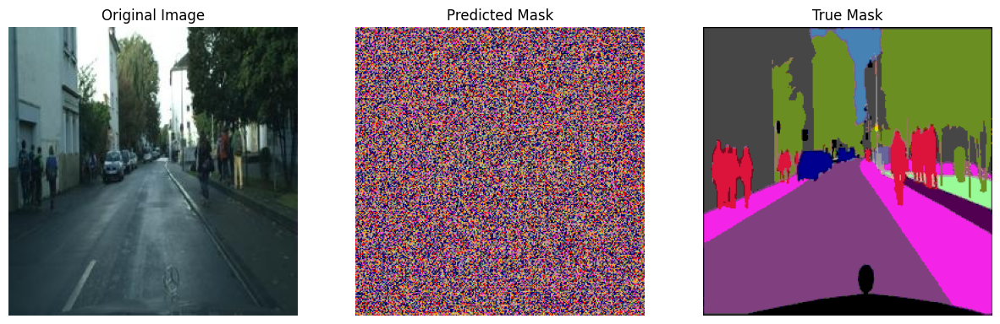

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.75it/s]



Epoch [1/50]
Training Loss: 2.0678, Training mIoU: 0.0325
Validation Loss: 1.5009, Validation mIoU: 0.0417


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  3  7 17 22]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


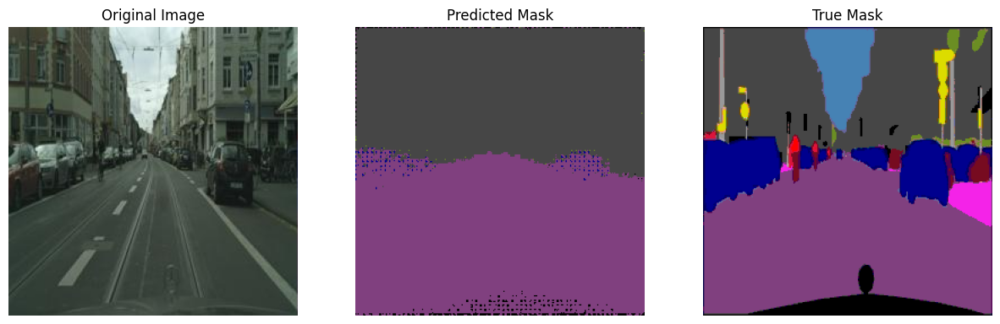

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.67it/s]



Epoch [2/50]
Training Loss: 1.2243, Training mIoU: 0.0929
Validation Loss: 1.2281, Validation mIoU: 0.1078


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  3  4  7 17 19 22]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


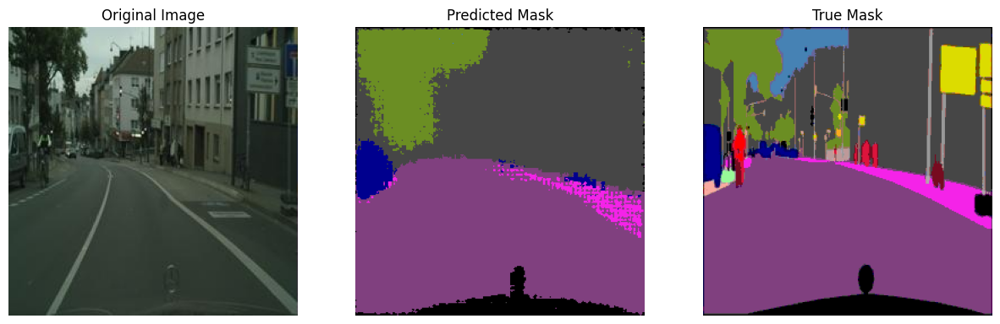

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.75it/s]



Epoch [3/50]
Training Loss: 0.9582, Training mIoU: 0.1461
Validation Loss: 0.9111, Validation mIoU: 0.1594


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  3  4  7 17 19 22]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


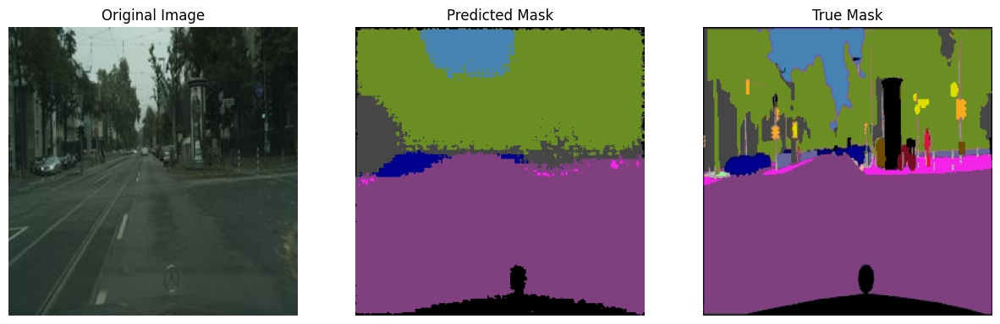

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.79it/s]



Epoch [4/50]
Training Loss: 0.8375, Training mIoU: 0.1663
Validation Loss: 0.8601, Validation mIoU: 0.1663


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  3  4  7  8 17 19 22 23 26]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


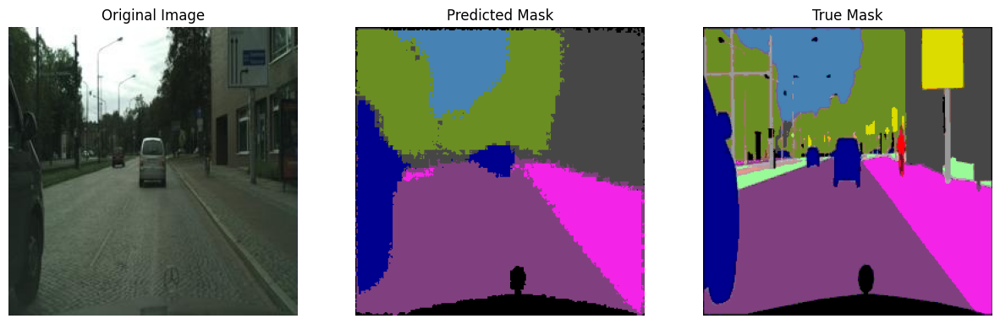

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.75it/s]



Epoch [5/50]
Training Loss: 0.7763, Training mIoU: 0.1752
Validation Loss: 0.8036, Validation mIoU: 0.1768


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  3  4  7  8  9 17 18 19 20 22 23 26]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


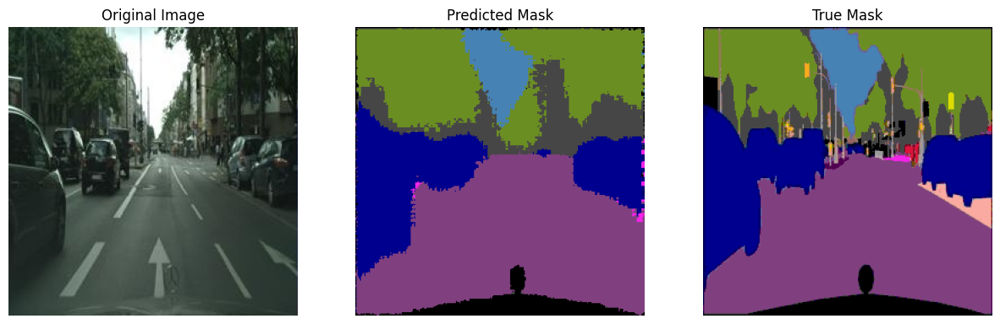

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]



Epoch [6/50]
Training Loss: 0.7065, Training mIoU: 0.1901
Validation Loss: 0.7601, Validation mIoU: 0.1937


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  2  3  4  7  8  9 17 18 19 20 22 23 24 26]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


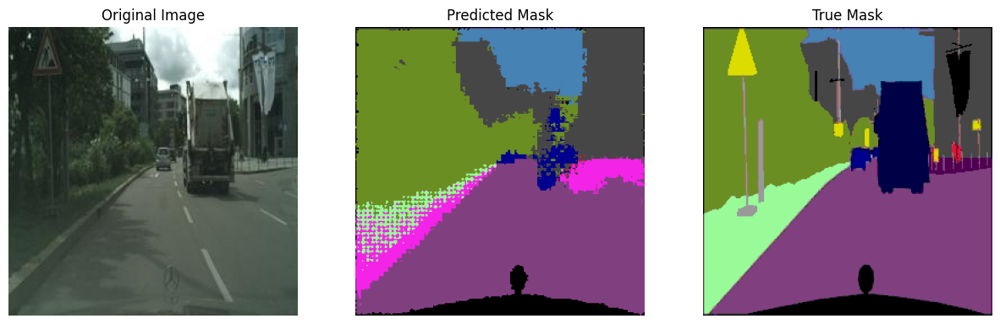

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]



Epoch [7/50]
Training Loss: 0.6710, Training mIoU: 0.2054
Validation Loss: 0.7621, Validation mIoU: 0.2022


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  2  3  4  5  7  8  9 17 18 19 20 22 23 26]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


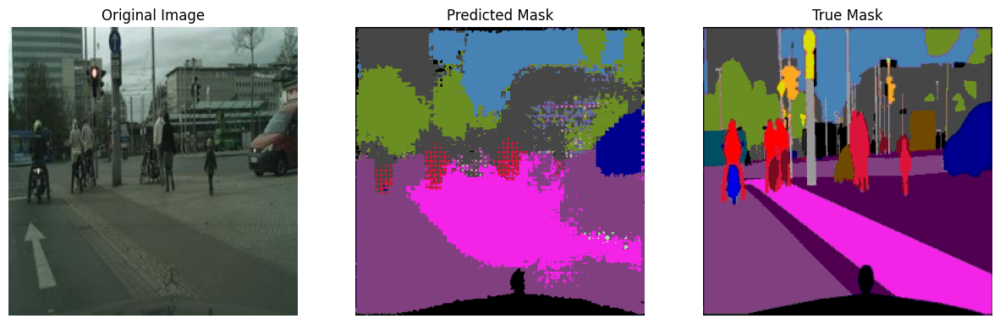

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.84it/s]



Epoch [8/50]
Training Loss: 0.6383, Training mIoU: 0.2165
Validation Loss: 0.6985, Validation mIoU: 0.2151


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  2  3  4  5  7  8  9 17 18 19 20 22 23 24 26]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


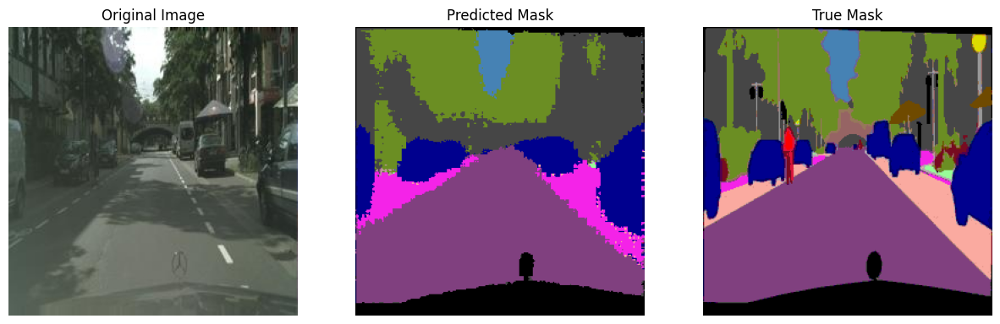

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.66it/s]



Epoch [9/50]
Training Loss: 0.5926, Training mIoU: 0.2323
Validation Loss: 0.6906, Validation mIoU: 0.2235


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  2  3  4  5  7  8  9 16 17 18 19 20 22 23 24 26 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


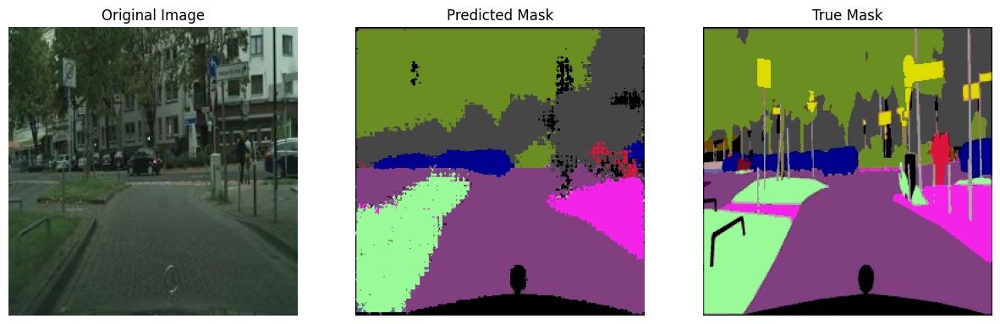

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.77it/s]



Epoch [10/50]
Training Loss: 0.5795, Training mIoU: 0.2414
Validation Loss: 0.6693, Validation mIoU: 0.2331


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  2  3  4  5  7  8  9 16 17 18 19 20 22 23 24 26 27]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


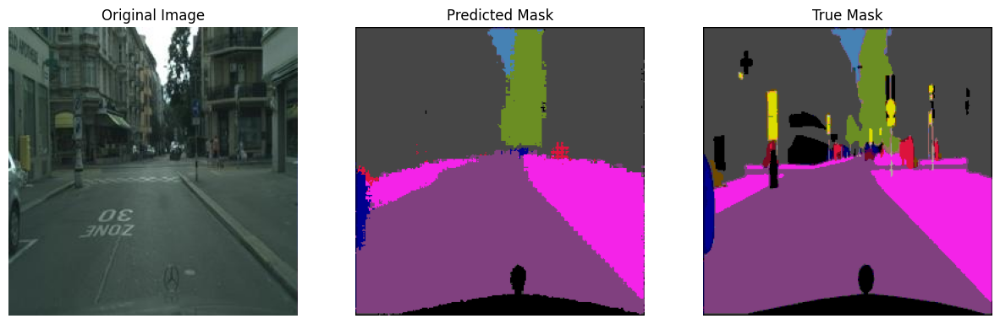

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]



Epoch [11/50]
Training Loss: 0.5535, Training mIoU: 0.2558
Validation Loss: 0.6880, Validation mIoU: 0.2328
EarlyStopping counter: 1 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  2  3  4  5  7  8  9 16 17 18 19 20 22 23 24 26 27 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 29]


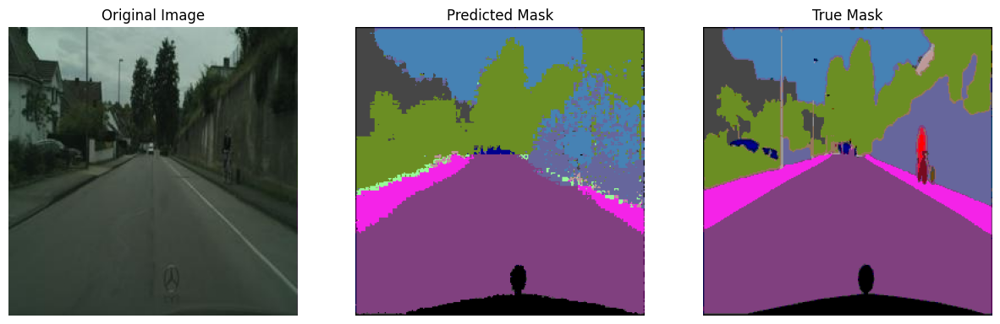

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.87it/s]



Epoch [12/50]
Training Loss: 0.5487, Training mIoU: 0.2618
Validation Loss: 0.6800, Validation mIoU: 0.2366
EarlyStopping counter: 2 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  2  3  4  5  6  7  8  9 16 17 18 19 20 22 23 24 26 27 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


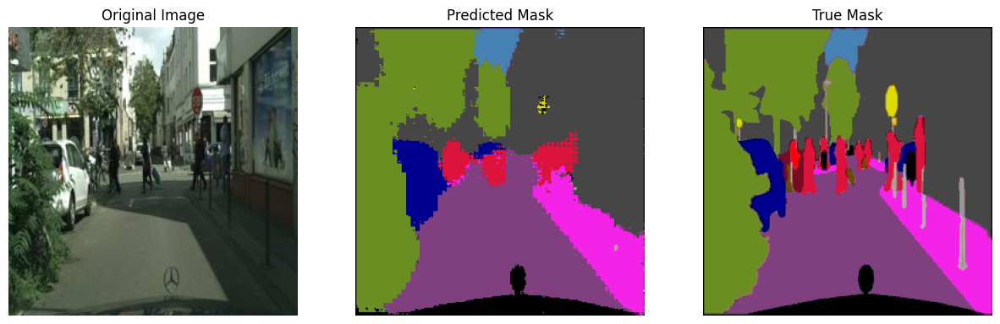

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]



Epoch [13/50]
Training Loss: 0.5220, Training mIoU: 0.2720
Validation Loss: 0.6615, Validation mIoU: 0.2468


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  2  3  4  5  6  7  8  9 11 16 17 18 19 20 22 23 24 26 27 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


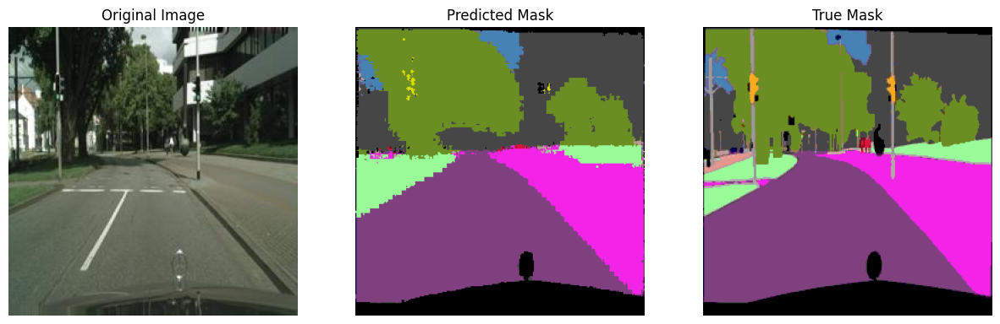

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.81it/s]



Epoch [14/50]
Training Loss: 0.5283, Training mIoU: 0.2739
Validation Loss: 0.6997, Validation mIoU: 0.2422
EarlyStopping counter: 1 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  2  3  4  5  6  7  8  9 11 16 17 18 19 20 22 23 24 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 22 23 24 25
 26 27 28 29]


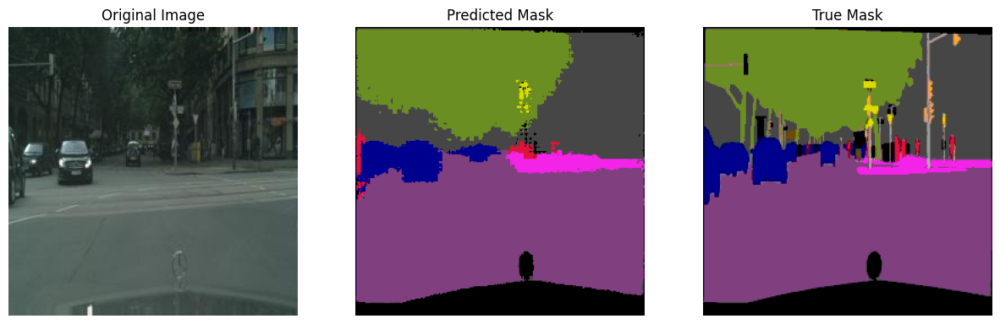

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.76it/s]



Epoch [15/50]
Training Loss: 0.5095, Training mIoU: 0.2814
Validation Loss: 0.6436, Validation mIoU: 0.2487


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  2  3  4  5  6  7  8  9 11 12 13 16 17 18 19 20 22 23 24 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


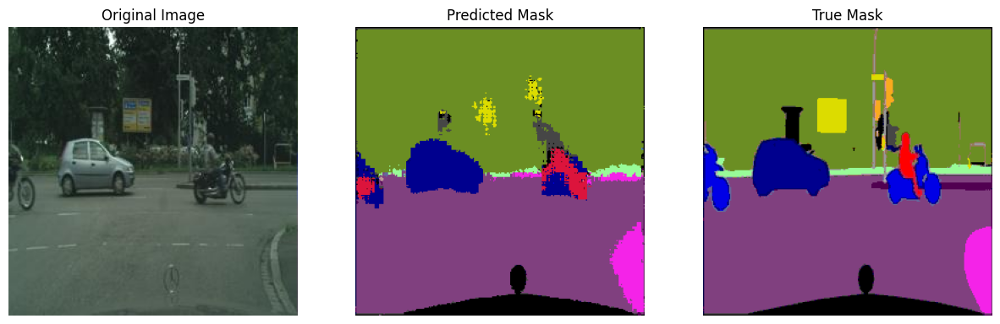

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]



Epoch [16/50]
Training Loss: 0.4720, Training mIoU: 0.2971
Validation Loss: 0.6386, Validation mIoU: 0.2583


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  2  3  4  5  6  7  8  9 10 11 12 13 16 17 18 19 20 22 23 24 25 26 27
 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 29]


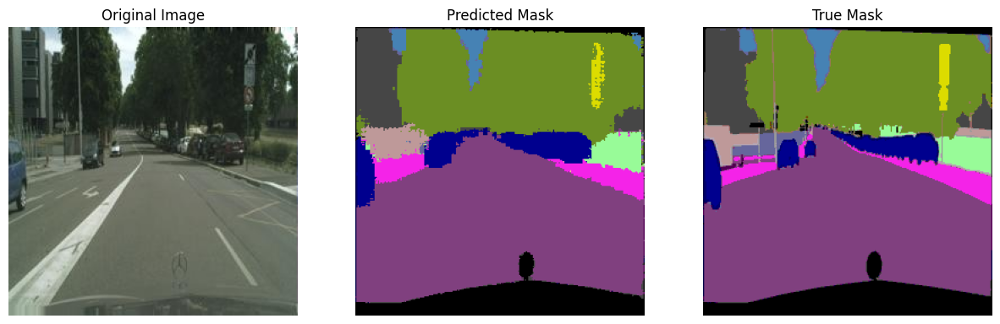

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.91it/s]



Epoch [17/50]
Training Loss: 0.4453, Training mIoU: 0.3103
Validation Loss: 0.6500, Validation mIoU: 0.2639
EarlyStopping counter: 1 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  2  3  4  5  6  7  8  9 11 12 13 16 17 18 19 20 22 23 24 25 26 27 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 29]


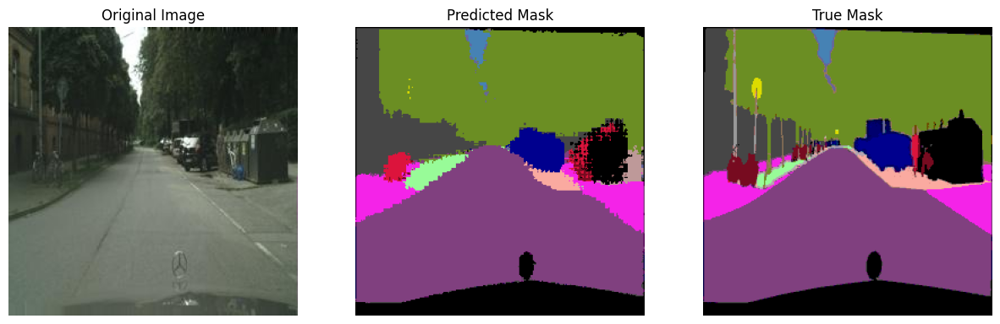

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.85it/s]



Epoch [18/50]
Training Loss: 0.4353, Training mIoU: 0.3174
Validation Loss: 0.6470, Validation mIoU: 0.2669
EarlyStopping counter: 2 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 11 12 13 16 17 18 19 20 22 23 24 25 26 27
 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


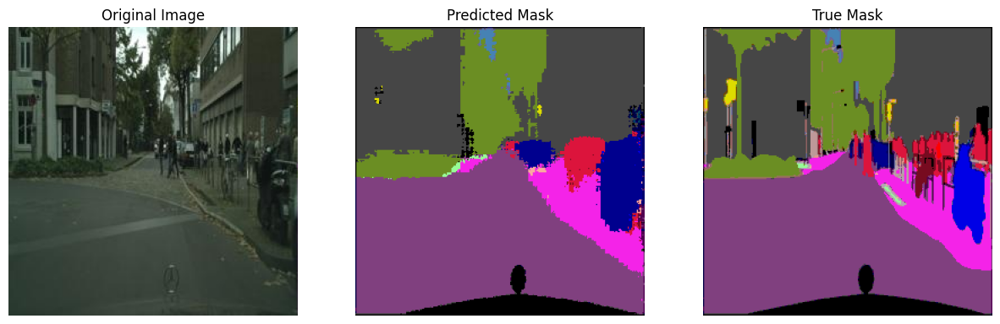

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.88it/s]



Epoch [19/50]
Training Loss: 0.4201, Training mIoU: 0.3268
Validation Loss: 0.6443, Validation mIoU: 0.2674
EarlyStopping counter: 3 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  2  3  4  5  6  7  8  9 10 11 12 13 16 17 18 19 20 22 23 24 25 26 27
 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


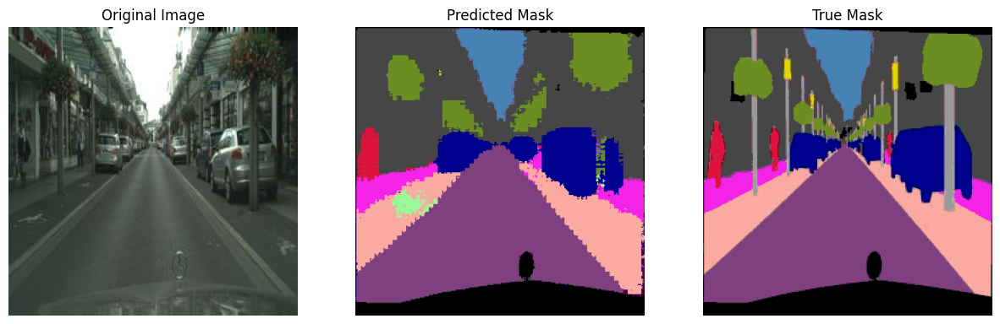

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.89it/s]



Epoch [20/50]
Training Loss: 0.4048, Training mIoU: 0.3370
Validation Loss: 0.6370, Validation mIoU: 0.2730
EarlyStopping counter: 4 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 16 17 18 19 20 22 23 24 25 26
 27 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 29]


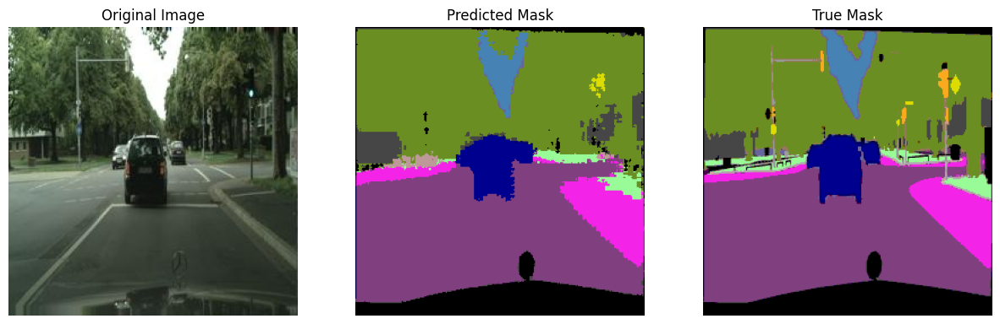

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.82it/s]



Epoch [21/50]
Training Loss: 0.3906, Training mIoU: 0.3466
Validation Loss: 0.6683, Validation mIoU: 0.2732
EarlyStopping counter: 5 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 22 23 24 25
 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


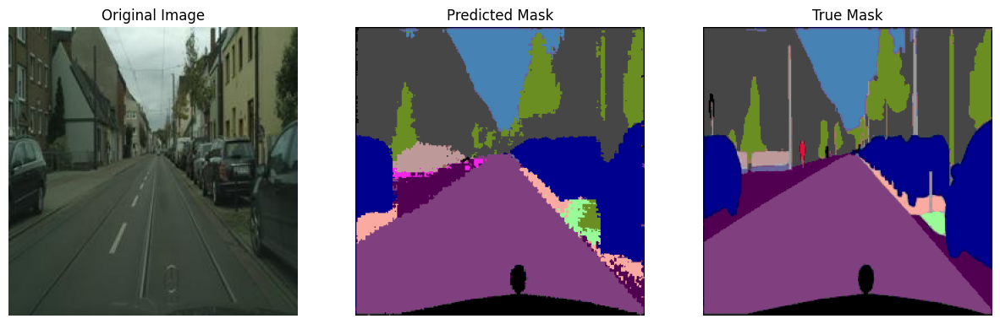

Validation: 100%|██████████| 50/50 [00:09<00:00,  5.26it/s]



Epoch [22/50]
Training Loss: 0.3816, Training mIoU: 0.3528
Validation Loss: 0.6446, Validation mIoU: 0.2768
EarlyStopping counter: 6 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 16 17 18 19 20 22 23 24 25 26
 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


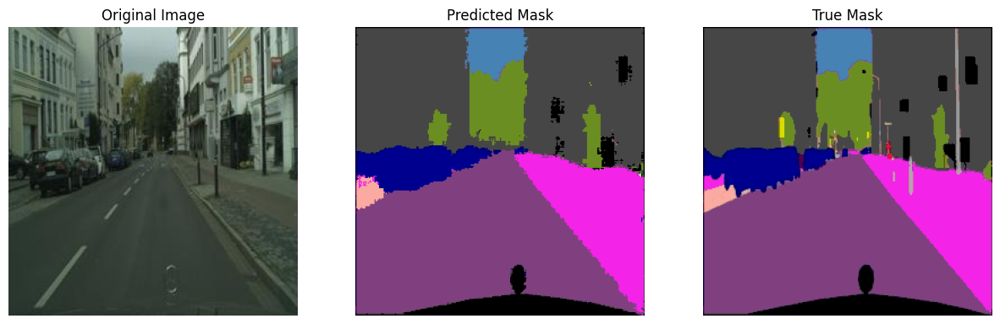

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.67it/s]



Epoch [23/50]
Training Loss: 0.3657, Training mIoU: 0.3640
Validation Loss: 0.6528, Validation mIoU: 0.2806
EarlyStopping counter: 7 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 16 17 18 19 20 21 22 23 24 25
 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 29]


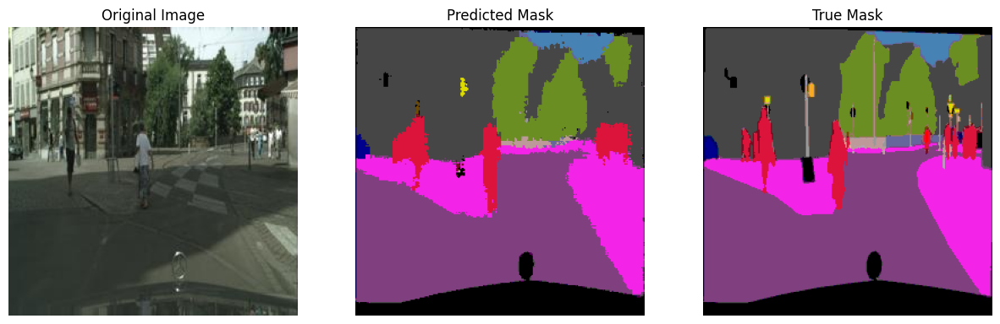

Validation: 100%|██████████| 50/50 [00:10<00:00,  4.64it/s]



Epoch [24/50]
Training Loss: 0.4460, Training mIoU: 0.3282
Validation Loss: 0.7015, Validation mIoU: 0.2513
EarlyStopping counter: 8 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 11 12 13 15 16 17 18 19 20 21 22 23 24 25
 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


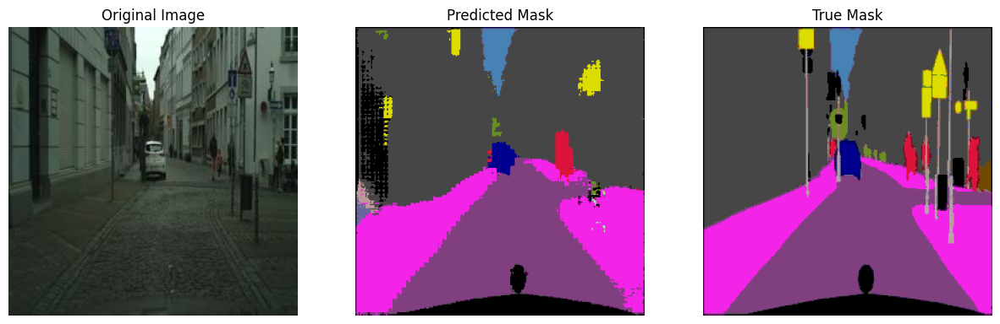

Validation: 100%|██████████| 50/50 [00:18<00:00,  2.75it/s]



Epoch [25/50]
Training Loss: 0.4342, Training mIoU: 0.3289
Validation Loss: 0.6703, Validation mIoU: 0.2614
EarlyStopping counter: 9 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  7  8  9 11 12 13 16 17 18 19 20 22 23 24 25 26 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 29]


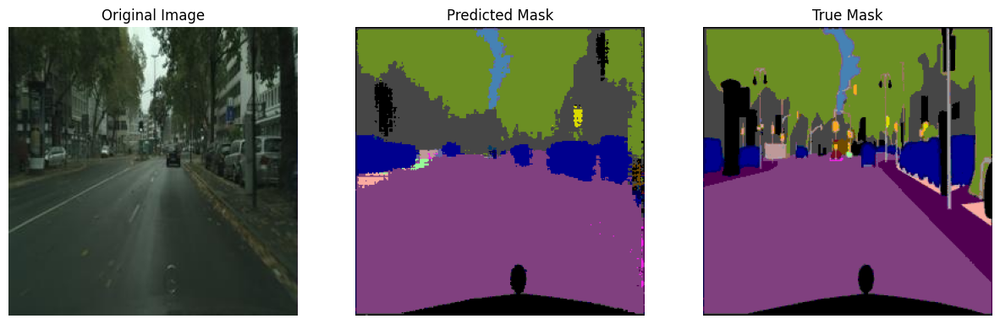

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.66it/s]



Epoch [26/50]
Training Loss: 0.4076, Training mIoU: 0.3446
Validation Loss: 0.6324, Validation mIoU: 0.2778


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 29]


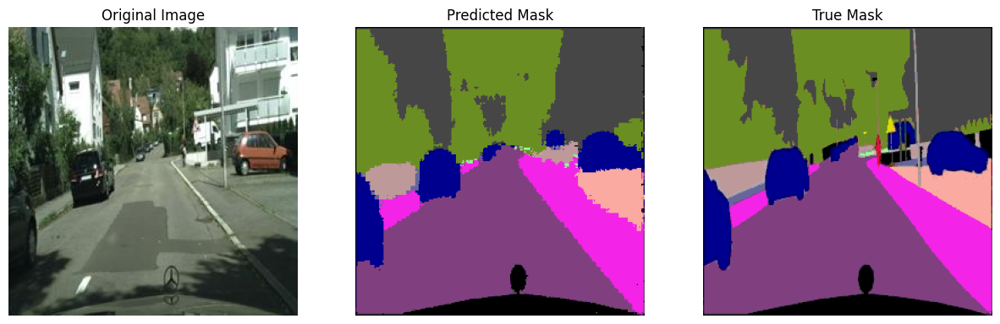

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.70it/s]



Epoch [27/50]
Training Loss: 0.3587, Training mIoU: 0.3740
Validation Loss: 0.6260, Validation mIoU: 0.2838


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


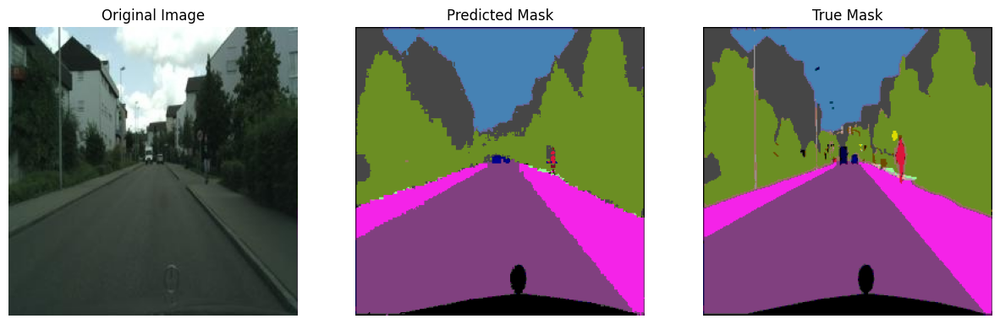

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.69it/s]



Epoch [28/50]
Training Loss: 0.3321, Training mIoU: 0.3929
Validation Loss: 0.6305, Validation mIoU: 0.2929
EarlyStopping counter: 1 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 22 23 24 25
 26 27 28 29]


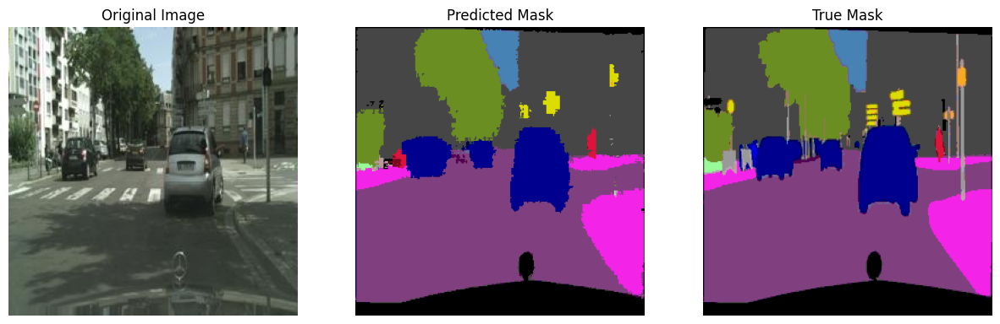

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.70it/s]



Epoch [29/50]
Training Loss: 0.3171, Training mIoU: 0.4069
Validation Loss: 0.6376, Validation mIoU: 0.2968
EarlyStopping counter: 2 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 22 23 24 25
 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 29]


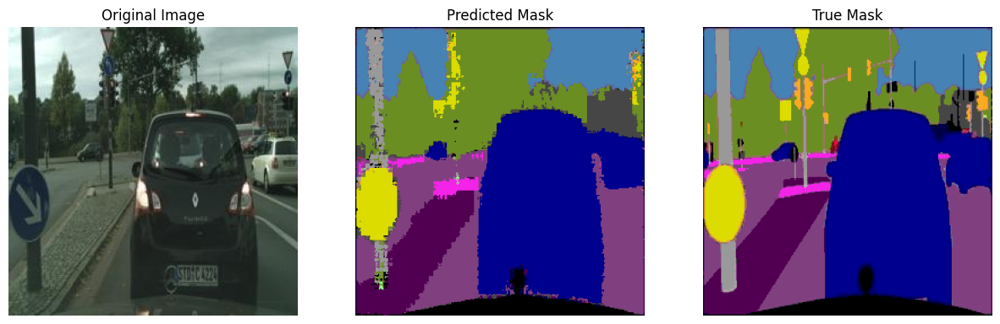

Validation: 100%|██████████| 50/50 [00:09<00:00,  5.18it/s]



Epoch [30/50]
Training Loss: 0.3074, Training mIoU: 0.4139
Validation Loss: 0.6344, Validation mIoU: 0.2973
EarlyStopping counter: 3 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 22 23 24 25
 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


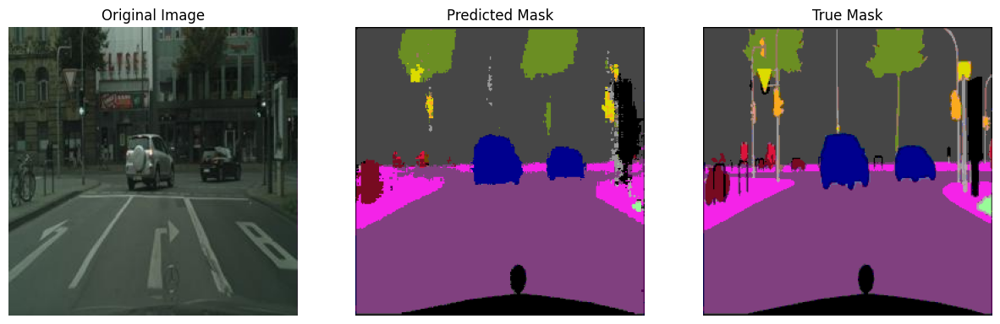

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.62it/s]



Epoch [31/50]
Training Loss: 0.2973, Training mIoU: 0.4236
Validation Loss: 0.6575, Validation mIoU: 0.2973
EarlyStopping counter: 4 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


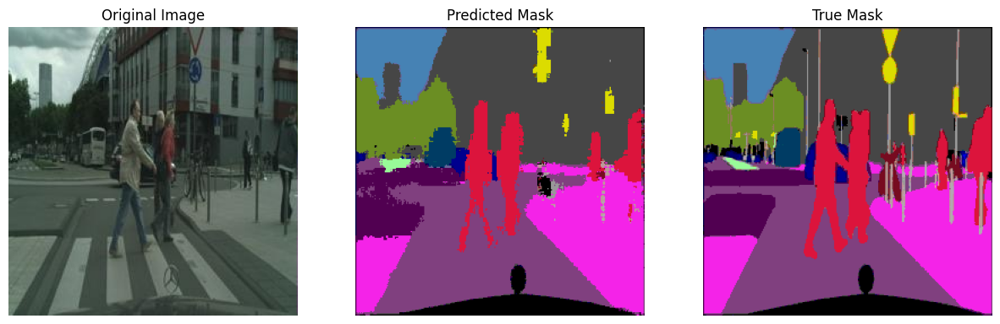

Validation: 100%|██████████| 50/50 [00:09<00:00,  5.09it/s]



Epoch [32/50]
Training Loss: 0.2918, Training mIoU: 0.4308
Validation Loss: 0.6439, Validation mIoU: 0.3008
EarlyStopping counter: 5 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


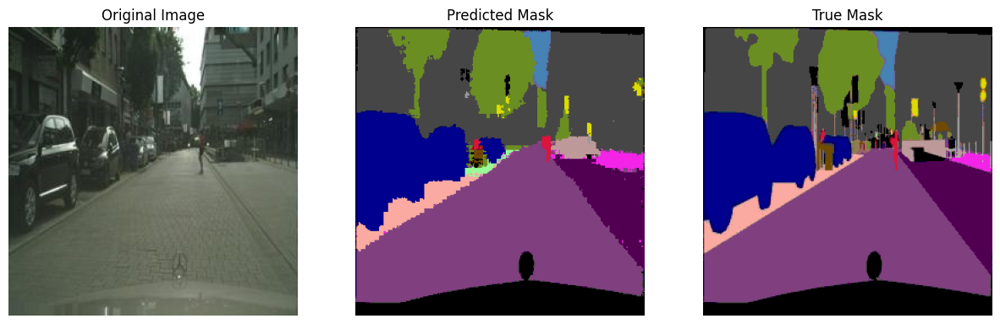

Validation: 100%|██████████| 50/50 [00:09<00:00,  5.22it/s]



Epoch [33/50]
Training Loss: 0.2876, Training mIoU: 0.4346
Validation Loss: 0.6956, Validation mIoU: 0.2899
EarlyStopping counter: 6 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


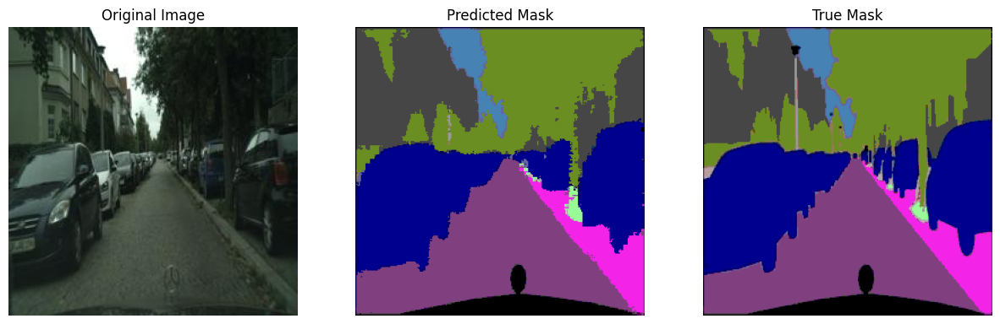

Validation: 100%|██████████| 50/50 [00:09<00:00,  5.33it/s]



Epoch [34/50]
Training Loss: 0.2899, Training mIoU: 0.4321
Validation Loss: 0.6732, Validation mIoU: 0.3021
EarlyStopping counter: 7 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


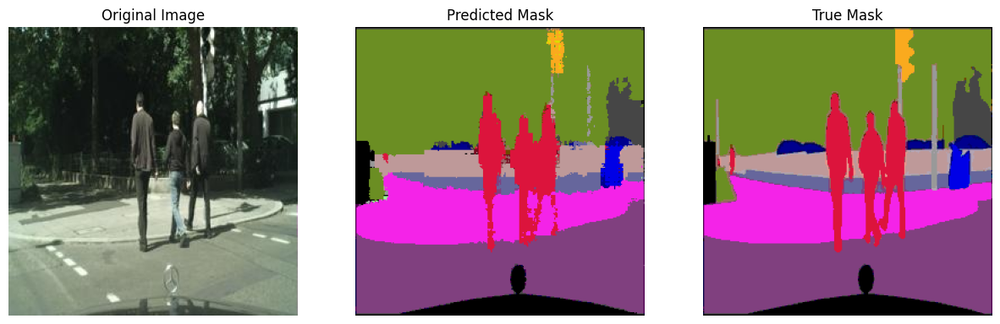

Validation: 100%|██████████| 50/50 [00:09<00:00,  5.44it/s]



Epoch [35/50]
Training Loss: 0.2857, Training mIoU: 0.4388
Validation Loss: 0.6679, Validation mIoU: 0.2983
EarlyStopping counter: 8 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


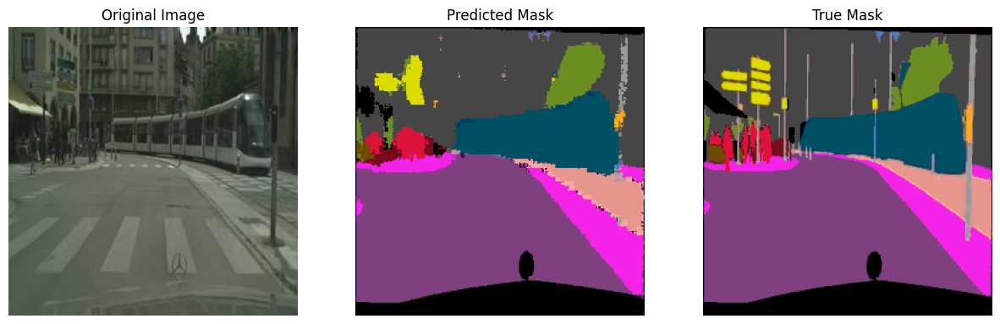

Validation: 100%|██████████| 50/50 [00:09<00:00,  5.53it/s]



Epoch [36/50]
Training Loss: 0.2737, Training mIoU: 0.4509
Validation Loss: 0.6557, Validation mIoU: 0.3025
EarlyStopping counter: 9 out of 10


  0%|          | 0/199 [00:00<?, ?it/s]


Predicted mask shape: (12, 256, 256)
True mask shape: (12, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29]


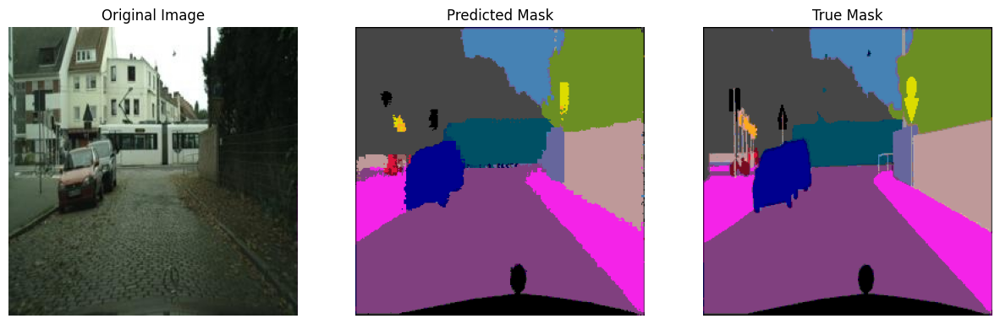

Validation: 100%|██████████| 50/50 [00:08<00:00,  5.62it/s]



Epoch [37/50]
Training Loss: 0.2998, Training mIoU: 0.4367
Validation Loss: 0.7553, Validation mIoU: 0.2717
EarlyStopping counter: 10 out of 10
Early stopping triggered
Training finished!


In [28]:
# Initialize model, loss function, and optimizer
model = SegResNet(num_classes=num_classes).to(device)
criterion = nn.CrossEntropyLoss(reduction='mean')
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
early_stopping = EarlyStopping(patience=10, min_delta=0.005, verbose=True, min_epochs=10)

# Add these lists before the training loop to store metrics
train_losses = []
val_losses = []
train_mious = []
val_mious = []

# Initialize the IoU metric
jaccard = JaccardIndex(task="multiclass", num_classes=num_classes).to(device)

# Training loop
for epoch in range(num_epochs):
    # Training phase
    model.train()
    running_loss = 0.0
    train_batch_mious = []
    batch_idx = 0
    # Use tqdm for progress bar
    for (images, masks) in tqdm(train_loader):
        # Move data to device
        images = images.float().to(device)
        # Remove the channel dimension (squeeze) from masks
        masks = masks.squeeze(1).long().to(device)  # Changed from squeeze(3) to squeeze(1)
        
        # Zero the gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(images)
        
        # Calculate loss
        loss = criterion(outputs, masks)
        
        # Backward pass and optimize
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

        # Print loss every 10 batches
        #if (batch_idx + 1) % 10 == 0:
        #    print(f'Batch [{batch_idx+1}/{len(dataloader)}] Loss: {loss.item():.4f}')
        
        # Print predictions for the first batch of each epoch
        
         # Calculate training mIoU
        with torch.no_grad():
            preds = torch.argmax(outputs, dim=1)
            batch_miou = jaccard(preds, masks)
            train_batch_mious.append(batch_miou.item())

        if batch_idx == 0:
            with torch.no_grad():
                # Get predictions
                pred_masks = torch.argmax(outputs, dim=1)
                
                # Convert tensors to numpy for visualization
                pred_masks = pred_masks.cpu().numpy()
                true_masks = masks.cpu().numpy()
                
                # Print shapes and unique values for debugging
                print(f"\nPredicted mask shape: {pred_masks.shape}")
                print(f"True mask shape: {true_masks.shape}")
                print(f"Unique values in prediction: {np.unique(pred_masks)}")
                print(f"Unique values in true mask: {np.unique(true_masks)}")
                
                # Convert predictions and true masks to RGB using id_map
                pred_rgb = np.zeros((pred_masks.shape[0], pred_masks.shape[1], pred_masks.shape[2], 3))
                true_rgb = np.zeros((true_masks.shape[0], true_masks.shape[1], true_masks.shape[2], 3))
                
                for i in range(pred_masks.shape[0]):
                    for key, value in id_map.items():
                        pred_rgb[i][pred_masks[i] == key] = value
                        true_rgb[i][true_masks[i] == key] = value
                
                plt.figure(figsize=(15, 5))
                plt.subplot(131)
                plt.imshow(images[0].cpu().permute(1,2,0))
                plt.title('Original Image')
                plt.axis('off')
                
                plt.subplot(132)
                plt.imshow(pred_rgb[0].astype(np.uint8))
                plt.title('Predicted Mask')
                plt.axis('off')
                
                plt.subplot(133)
                plt.imshow(true_rgb[0].astype(np.uint8))
                plt.title('True Mask')
                plt.axis('off')
                
                plt.show()
        batch_idx = batch_idx + 1
    
    # Validation phase
    model.eval()
    val_loss = 0.0
    val_batch_mious = []

    with torch.no_grad():
        for images, masks in tqdm(val_loader, desc='Validation'):
            images = images.float().to(device)
            masks = masks.squeeze(1).long().to(device)
            
            outputs = model(images)
            loss = criterion(outputs, masks)
            val_loss += loss.item()

            # Calculate validation mIoU
            preds = torch.argmax(outputs, dim=1)
            batch_miou = jaccard(preds, masks)
            val_batch_mious.append(batch_miou.item())


    # Print average loss for the epoch
    # Calculate epoch metrics
    epoch_train_loss = running_loss / len(train_loader)
    epoch_val_loss = val_loss / len(val_loader)
    epoch_train_miou = np.mean(train_batch_mious)
    epoch_val_miou = np.mean(val_batch_mious)

    # Store metrics
    train_losses.append(epoch_train_loss)
    val_losses.append(epoch_val_loss)
    train_mious.append(epoch_train_miou)
    val_mious.append(epoch_val_miou)

     # Print metrics
    print(f'\nEpoch [{epoch+1}/{num_epochs}]')
    print(f'Training Loss: {epoch_train_loss:.4f}, Training mIoU: {epoch_train_miou:.4f}')
    print(f'Validation Loss: {epoch_val_loss:.4f}, Validation mIoU: {epoch_val_miou:.4f}')

    # Early stopping
    early_stopping(epoch_val_loss, model)
    if early_stopping.early_stop:
        print("Early stopping triggered")
        model.load_state_dict(early_stopping.best_model)
        break

print('Training finished!')

# Plotting

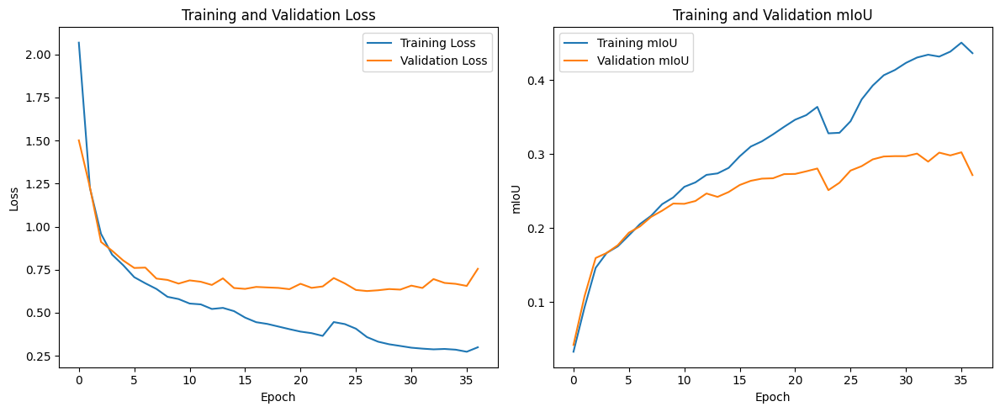

In [29]:
# Plot training curves
plt.figure(figsize=(12, 5))

# Loss curve
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# mIoU curve
plt.subplot(1, 2, 2)
plt.plot(train_mious, label='Training mIoU')
plt.plot(val_mious, label='Validation mIoU')
plt.xlabel('Epoch')
plt.ylabel('mIoU')
plt.title('Training and Validation mIoU')
plt.legend()

plt.tight_layout()
plt.show()

In [30]:
def save_model_as_npy(model, filepath):
    model_weights = model.state_dict()
    model_weights_dict = {k: v.cpu().numpy() for k, v in model_weights.items()}
    np.save(filepath, model_weights_dict)

In [31]:
save_model_as_npy(model, 'best_Segnet_weight.npy')

# Testing

c:\Users\113064516\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\113064516\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
c:\Users\113064516\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Non

Load weights successfully.


Testing:   0%|          | 0/125 [00:00<?, ?it/s]


Predicted mask shape: (4, 256, 256)
True mask shape: (4, 256, 256)
Unique values in prediction: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 21 22 23 24
 26 27 28 29]
Unique values in true mask: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 15 16 17 18 19 20 22 23 24 25
 26 27 29]


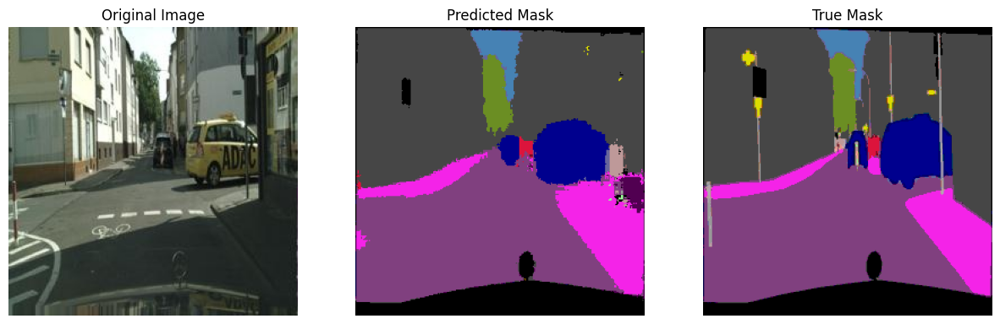

Testing: 100%|██████████| 125/125 [00:10<00:00, 11.42it/s]


Mean IoU: 0.2430
Mean Pixel Accuracy: 0.8326


Per-class IoU:   0%|          | 0/125 [00:00<?, ?it/s]



Mean IoU (excluding zeros): 0.3997
Mean IoU (including zeros): 0.2402
Mean Pixel Accuracy: 0.8326

IoU per class:
Class 0: 0.7997
Class 1: 0.1444
Class 2: 0.0830
Class 3: 0.8488
Class 4: 0.6129
Class 5: 0.0000
Class 6: 0.0022
Class 7: 0.6608
Class 8: 0.1428
Class 9: 0.1994
Class 10: 0.0000
Class 11: 0.0025
Class 12: 0.0028
Class 13: 0.0038
Class 14: 0.0000
Class 15: 0.0000
Class 16: 0.0373
Class 17: 0.7438
Class 18: 0.0374
Class 19: 0.8217
Class 20: 0.3613
Class 21: 0.0000
Class 22: 0.7037
Class 23: 0.3582
Class 24: 0.3461
Class 25: 0.0000
Class 26: 0.1085
Class 27: 0.0000
Class 28: 0.0000
Class 29: 0.1846

Number of classes with non-zero IoU: 18
Number of classes with zero IoU: 12


In [13]:
# Evaluate model (dummy example, replace with actual evaluation loop)
model = SegResNet(num_classes=num_classes).to(device)
weights = np.load('best_Segnet_weight.npy', allow_pickle=True).item()

# Convert numpy arrays to torch tensors
state_dict = {k: torch.from_numpy(v) for k, v in weights.items()}
model.load_state_dict(state_dict)
print("Load weights successfully.")
model.eval()

image_dir = "cityscapes_data/cityscapes_data/val"
mask_dir = "cityscapes_data/cityscapes_data/val_mask"

dataset = CityscapeDataset(
        image_dir=image_dir,
        mask_dir=mask_dir
    )
dataloader = DataLoader(
    dataset,
    batch_size=4,
    shuffle=False
)

# Initialize the metric
jaccard = JaccardIndex(task="multiclass", num_classes=num_classes).to(device)

# Testing loop
model.eval()
miou_scores = []
pixel_accuracies = []


batch_idx = 0
with torch.no_grad():
    for images, masks in tqdm(dataloader, desc='Testing'):
        # Move data to device
        images = images.float().to(device)
        masks = masks.squeeze(1).long().to(device)  # Remove channel dimension
        
        # Forward pass
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)
        
        # Calculate IoU
        batch_iou = jaccard(preds, masks)
        miou_scores.append(batch_iou.item())

         # Calculate pixel-wise accuracy
        correct_pixels = (preds == masks).sum().item()
        total_pixels = masks.numel()
        pixel_accuracy = correct_pixels / total_pixels
        pixel_accuracies.append(pixel_accuracy)

        # Print predictions for the first batch of each epoch
        if batch_idx == 0:
            with torch.no_grad():
                # Get predictions
                pred_masks = torch.argmax(outputs, dim=1)
                
                # Convert tensors to numpy for visualization
                pred_masks = pred_masks.cpu().numpy()
                true_masks = masks.cpu().numpy()
                
                # Print shapes and unique values for debugging
                print(f"\nPredicted mask shape: {pred_masks.shape}")
                print(f"True mask shape: {true_masks.shape}")
                print(f"Unique values in prediction: {np.unique(pred_masks)}")
                print(f"Unique values in true mask: {np.unique(true_masks)}")
                
                # Convert predictions and true masks to RGB using id_map
                pred_rgb = np.zeros((pred_masks.shape[0], pred_masks.shape[1], pred_masks.shape[2], 3))
                true_rgb = np.zeros((true_masks.shape[0], true_masks.shape[1], true_masks.shape[2], 3))
                
                for i in range(pred_masks.shape[0]):
                    for key, value in id_map.items():
                        pred_rgb[i][pred_masks[i] == key] = value
                        true_rgb[i][true_masks[i] == key] = value
                
                plt.figure(figsize=(15, 5))
                plt.subplot(131)
                plt.imshow(images[0].cpu().permute(1,2,0))
                plt.title('Original Image')
                plt.axis('off')
                
                plt.subplot(132)
                plt.imshow(pred_rgb[0].astype(np.uint8))
                plt.title('Predicted Mask')
                plt.axis('off')
                
                plt.subplot(133)
                plt.imshow(true_rgb[0].astype(np.uint8))
                plt.title('True Mask')
                plt.axis('off')
                
                plt.show()
        batch_idx = batch_idx + 1

# Calculate and print mean IoU and pixel-wise accuracy
mean_iou = np.mean(miou_scores)
mean_pixel_accuracy = np.mean(pixel_accuracies)
print(f"Mean IoU: {mean_iou:.4f}")
print(f"Mean Pixel Accuracy: {mean_pixel_accuracy:.4f}")

# Calculate per-class IoU
class_iou = JaccardIndex(task="multiclass", num_classes=num_classes, average=None).to(device)
with torch.no_grad():
    for images, masks in tqdm(dataloader, desc='Per-class IoU'):
        images = images.float().to(device)
        masks = masks.squeeze(1).long().to(device)
        
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)
        
        iou_per_class = class_iou(preds, masks)
        break  # Just for one batch as example

# Move tensor to CPU and convert to numpy for calculations
iou_per_class = iou_per_class.cpu().numpy()

# Calculate mean IoU excluding zeros
non_zero_ious = [iou for iou in iou_per_class if iou > 0.01]
mean_iou_no_zeros = np.mean(non_zero_ious) if non_zero_ious else 0
mean_pixel_accuracy = np.mean(pixel_accuracies)

print(f"\nMean IoU (excluding zeros): {mean_iou_no_zeros:.4f}")
print(f"Mean IoU (including zeros): {np.mean(iou_per_class):.4f}")
print(f"Mean Pixel Accuracy: {mean_pixel_accuracy:.4f}")

print("\nIoU per class:")
for class_id, iou in enumerate(iou_per_class):
    print(f"Class {class_id}: {iou:.4f}")

print(f"\nNumber of classes with non-zero IoU: {len(non_zero_ious)}")
print(f"Number of classes with zero IoU: {len(iou_per_class) - len(non_zero_ious)}")

# FLOPs

In [14]:
from calflops import calculate_flops

# Define a dummy input tensor with the same shape as your input images
dummy_input = (1, 3, 256, 256)  # Adjust the size if your input size is different

# Initialize your model
model = SegResNet(num_classes=num_classes).to(device)

flops, macs, params = calculate_flops(model=model, 
                                      input_shape=dummy_input,
                                      output_as_string=True,
                                      output_precision=4)
print("FLOPs:%s   MACs:%s   Params:%s \n" %(flops, macs, params))

c:\Users\113064516\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\113064516\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
c:\Users\113064516\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Non


------------------------------------- Calculate Flops Results -------------------------------------
Notations:
number of parameters (Params), number of multiply-accumulate operations(MACs),
number of floating-point operations (FLOPs), floating-point operations per second (FLOPS),
fwd FLOPs (model forward propagation FLOPs), bwd FLOPs (model backward propagation FLOPs),
default model backpropagation takes 2.00 times as much computation as forward propagation.

Total Training Params:                                                  122.84 M
fwd MACs:                                                               32.2741 GMACs
fwd FLOPs:                                                              64.7216 GFLOPS
fwd+bwd MACs:                                                           96.8224 GMACs
fwd+bwd FLOPs:                                                          194.165 GFLOPS

-------------------------------- Detailed Calculated FLOPs Results --------------------------------
Each mo

In [17]:
def count_parameters(model):
    """
    Count the total number of trainable parameters in the model
    """
    total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    # Convert to millions for better readability
    total_params_m = total_params / 1e6
    
    print(f'\nTotal Trainable Parameters: {total_params:,}')
    print(f'Total Trainable Parameters (M): {total_params_m:.2f}M')
    
    # Optional: Print parameters by layer
    print('\nParameters by layer:')
    for name, param in model.named_parameters():
        if param.requires_grad:
            print(f'{name}: {param.numel():,}')

# Call the function
model = SegResNet(num_classes=num_classes).to(device)
count_parameters(model)

c:\Users\113064516\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\113064516\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
c:\Users\113064516\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Non


Total Trainable Parameters: 122,841,054
Total Trainable Parameters (M): 122.84M

Parameters by layer:
first_conv.0.weight: 9,408
first_conv.1.weight: 64
first_conv.1.bias: 64
encoder.0.0.conv1.weight: 4,096
encoder.0.0.bn1.weight: 64
encoder.0.0.bn1.bias: 64
encoder.0.0.conv2.weight: 36,864
encoder.0.0.bn2.weight: 64
encoder.0.0.bn2.bias: 64
encoder.0.0.conv3.weight: 16,384
encoder.0.0.bn3.weight: 256
encoder.0.0.bn3.bias: 256
encoder.0.0.downsample.0.weight: 16,384
encoder.0.0.downsample.1.weight: 256
encoder.0.0.downsample.1.bias: 256
encoder.0.1.conv1.weight: 16,384
encoder.0.1.bn1.weight: 64
encoder.0.1.bn1.bias: 64
encoder.0.1.conv2.weight: 36,864
encoder.0.1.bn2.weight: 64
encoder.0.1.bn2.bias: 64
encoder.0.1.conv3.weight: 16,384
encoder.0.1.bn3.weight: 256
encoder.0.1.bn3.bias: 256
encoder.0.2.conv1.weight: 16,384
encoder.0.2.bn1.weight: 64
encoder.0.2.bn1.bias: 64
encoder.0.2.conv2.weight: 36,864
encoder.0.2.bn2.weight: 64
encoder.0.2.bn2.bias: 64
encoder.0.2.conv3.weight: 16,